In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
 

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv(r"C:\Users\Bhawna\Downloads\FitBit data.csv")
df.head(10)

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886
5,1503960366,3/30/2016,10970,7.16,7.16,0.0,2.36,0.51,4.29,0.0,30,13,223,1174,1820
6,1503960366,3/31/2016,12256,7.86,7.86,0.0,2.29,0.49,5.04,0.0,33,12,239,820,1889
7,1503960366,4/1/2016,12262,7.87,7.87,0.0,3.32,0.83,3.64,0.0,47,21,200,866,1868
8,1503960366,4/2/2016,11248,7.25,7.25,0.0,3.00,0.45,3.74,0.0,40,11,244,636,1843
9,1503960366,4/3/2016,10016,6.37,6.37,0.0,0.91,1.28,4.18,0.0,15,30,314,655,1850


In [18]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df)
profile.to_notebook_iframe() 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|█████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 717.18it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<h1 font-size:40px> Checking Null values</h1>

In [3]:
df.isnull().sum() / len(df)*100

Id                          0.0
ActivityDate                0.0
TotalSteps                  0.0
TotalDistance               0.0
TrackerDistance             0.0
LoggedActivitiesDistance    0.0
VeryActiveDistance          0.0
ModeratelyActiveDistance    0.0
LightActiveDistance         0.0
SedentaryActiveDistance     0.0
VeryActiveMinutes           0.0
FairlyActiveMinutes         0.0
LightlyActiveMinutes        0.0
SedentaryMinutes            0.0
Calories                    0.0
dtype: float64

In [4]:
df_raw = df.copy()
df_raw.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,3/25/2016,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819
1,1503960366,3/26/2016,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154
2,1503960366,3/27/2016,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944
3,1503960366,3/28/2016,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932
4,1503960366,3/29/2016,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886


In [5]:
df_raw['ActivityDate'] = pd.to_datetime(df_raw['ActivityDate'])

df_raw['Year'] = df_raw['ActivityDate'].dt.year
df_raw['Month'] = df_raw['ActivityDate'].dt.month
df_raw['Date'] = df_raw['ActivityDate'].dt.day
df_raw['Weekday'] = df_raw['ActivityDate'].dt.day_name()
df_raw.head()

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories,Year,Month,Date,Weekday
0,1503960366,2016-03-25,11004,7.11,7.11,0.0,2.57,0.46,4.07,0.0,33,12,205,804,1819,2016,3,25,Friday
1,1503960366,2016-03-26,17609,11.55,11.55,0.0,6.92,0.73,3.91,0.0,89,17,274,588,2154,2016,3,26,Saturday
2,1503960366,2016-03-27,12736,8.53,8.53,0.0,4.66,0.16,3.71,0.0,56,5,268,605,1944,2016,3,27,Sunday
3,1503960366,2016-03-28,13231,8.93,8.93,0.0,3.19,0.79,4.95,0.0,39,20,224,1080,1932,2016,3,28,Monday
4,1503960366,2016-03-29,12041,7.85,7.85,0.0,2.16,1.09,4.61,0.0,28,28,243,763,1886,2016,3,29,Tuesday


In [6]:
df_raw.drop(['TrackerDistance'], axis=1, inplace=True)

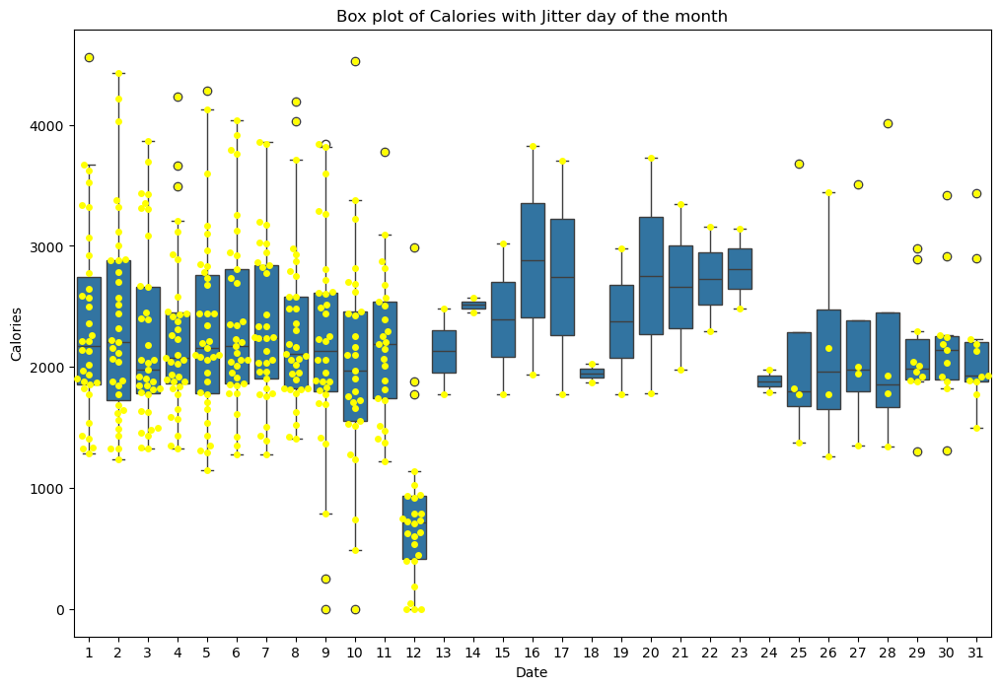

In [7]:
plt.figure(figsize=(12,8))
 
ax = sns.boxplot(x='Date', y='Calories', data=df_raw)
sns.swarmplot(x='Date', y='Calories', data=df_raw, color="yellow")
ax.set_title('Box plot of Calories with Jitter day of the month')
plt.show()

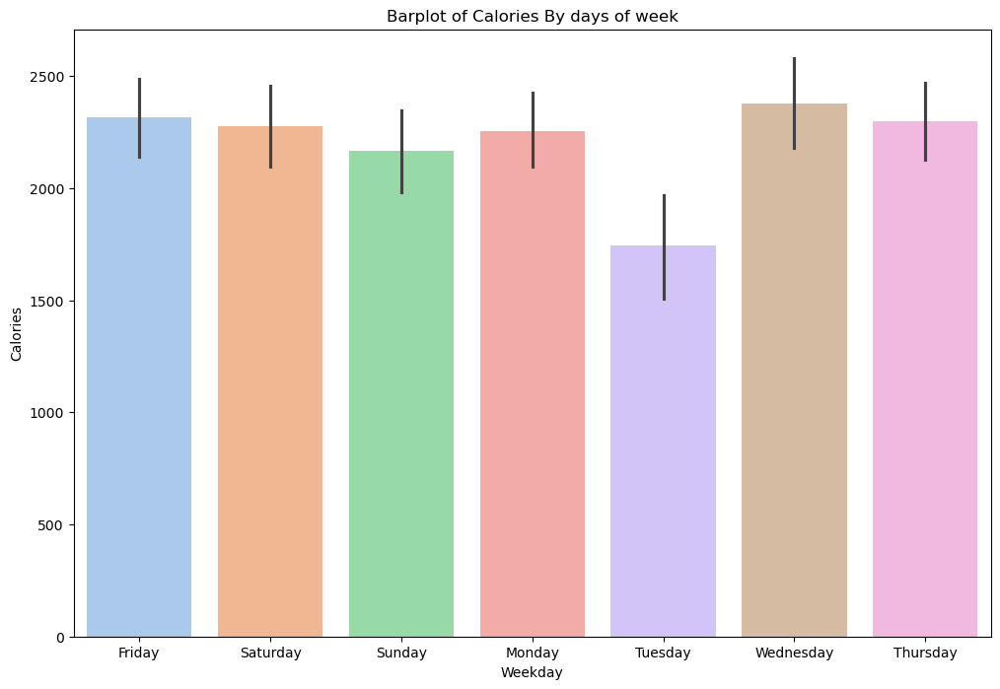

In [8]:
plt.figure(figsize=(12,8))

sns.barplot(x='Weekday', y='Calories', data=df_raw, palette='pastel')
plt.title('Barplot of Calories By days of week')
plt.show()

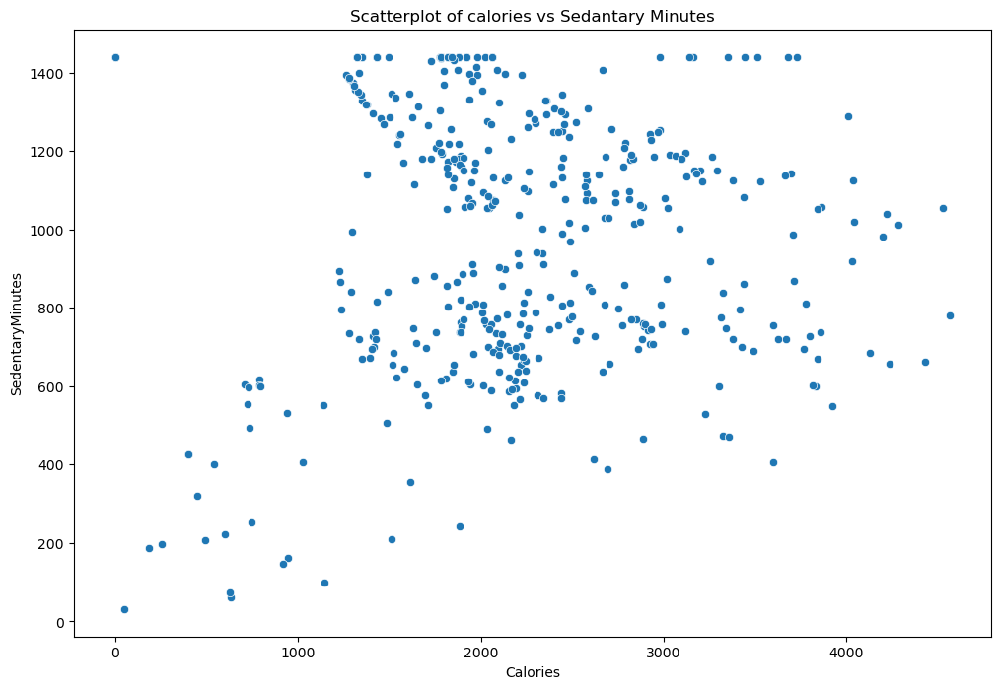

In [9]:
plt.figure(figsize=(12,8))

sns.scatterplot(x='Calories', y='SedentaryMinutes', data=df_raw)
plt.title("Scatterplot of calories vs Sedantary Minutes")
plt.show()

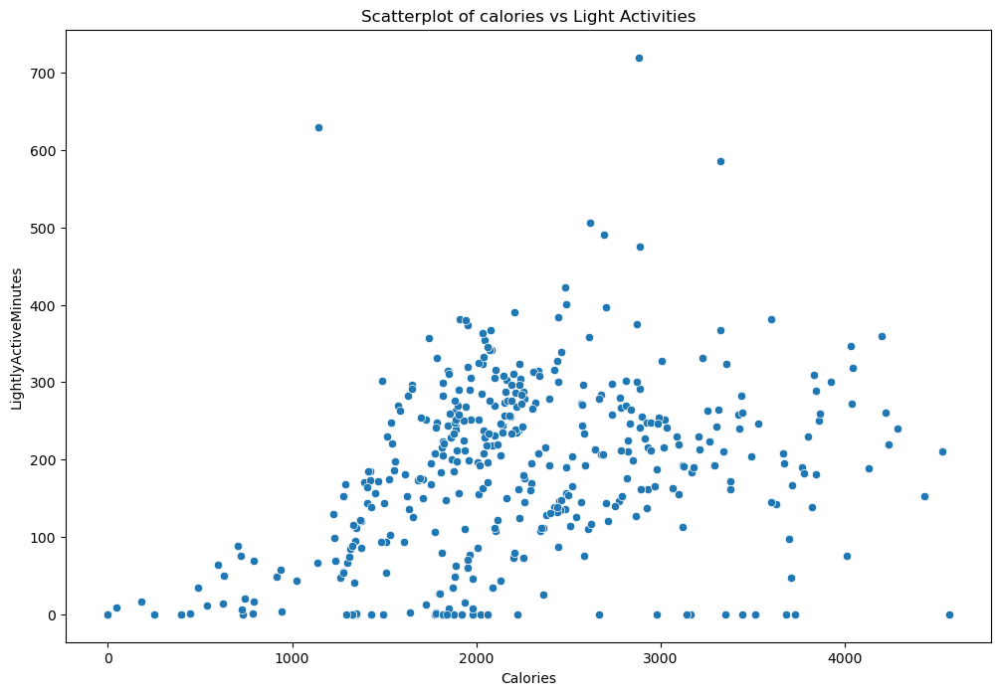

In [10]:
plt.figure(figsize=(12,8))

sns.scatterplot(x='Calories', y='LightlyActiveMinutes', data=df_raw)
plt.title("Scatterplot of calories vs Light Activities")
plt.show()

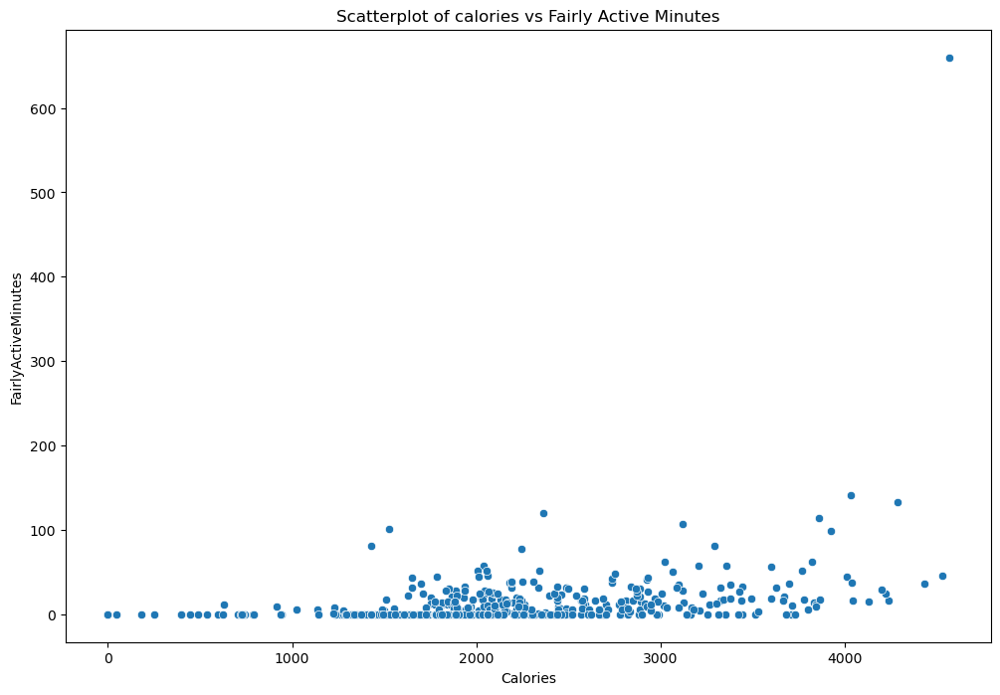

In [11]:
plt.figure(figsize=(12,8))

sns.scatterplot(x='Calories', y='FairlyActiveMinutes', data=df_raw)
plt.title("Scatterplot of calories vs Fairly Active Minutes")
plt.show()

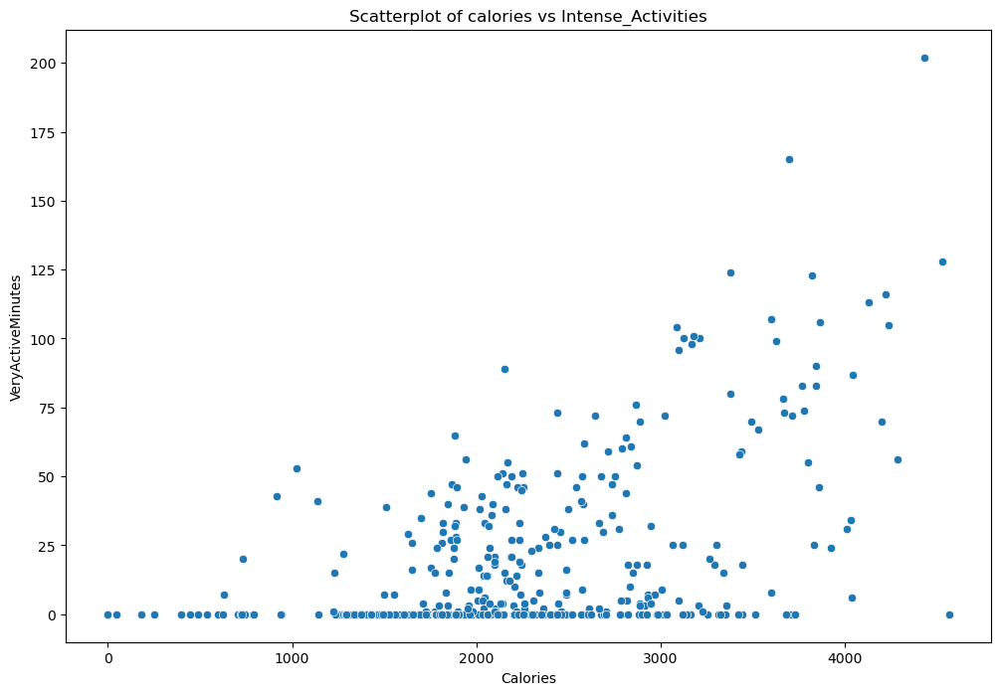

In [12]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Calories', y='VeryActiveMinutes', data=df_raw)
plt.title("Scatterplot of calories vs Intense_Activities")
plt.show()

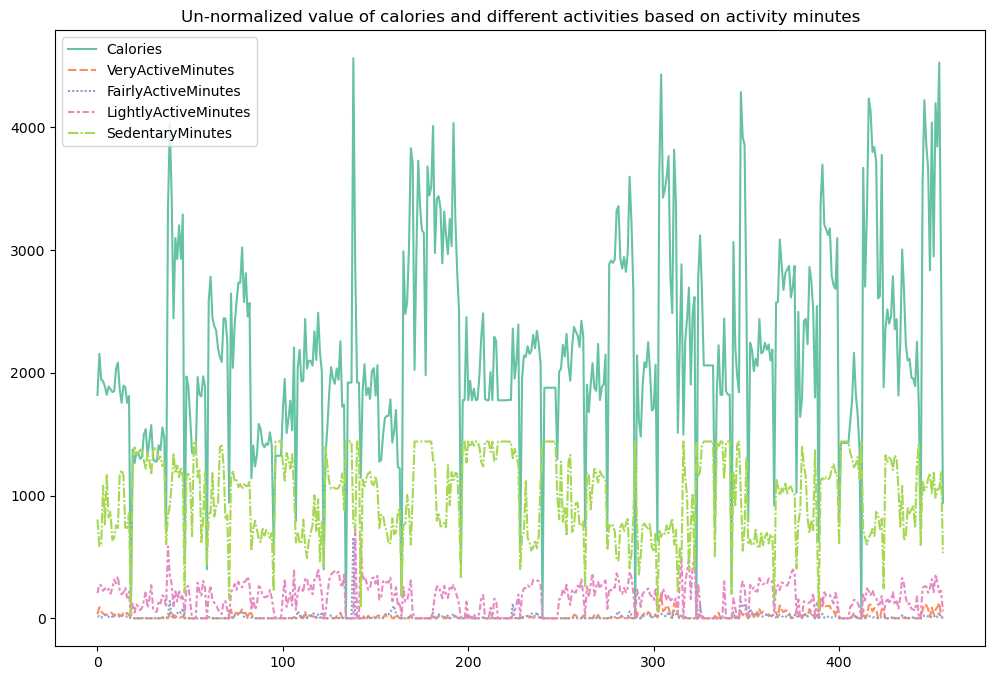

In [13]:
column = ['Calories', 'VeryActiveMinutes','FairlyActiveMinutes','LightlyActiveMinutes','SedentaryMinutes']
line_df = df_raw[column]

plt.figure(figsize=(12,8))
sns.lineplot(data=line_df, palette='Set2', estimator='mean')
plt.title("Un-normalized value of calories and different activities based on activity minutes")
plt.show()

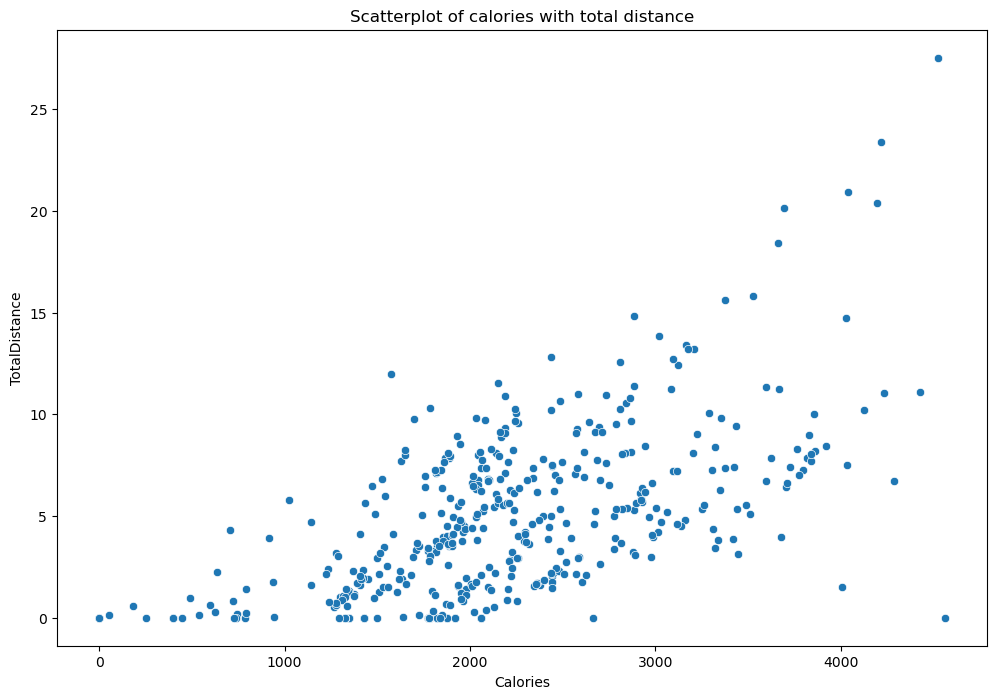

In [14]:
plt.figure(figsize=(12,8))

sns.scatterplot(x='Calories', y='TotalDistance', data=df_raw)
plt.title("Scatterplot of calories with total distance")
plt.show()

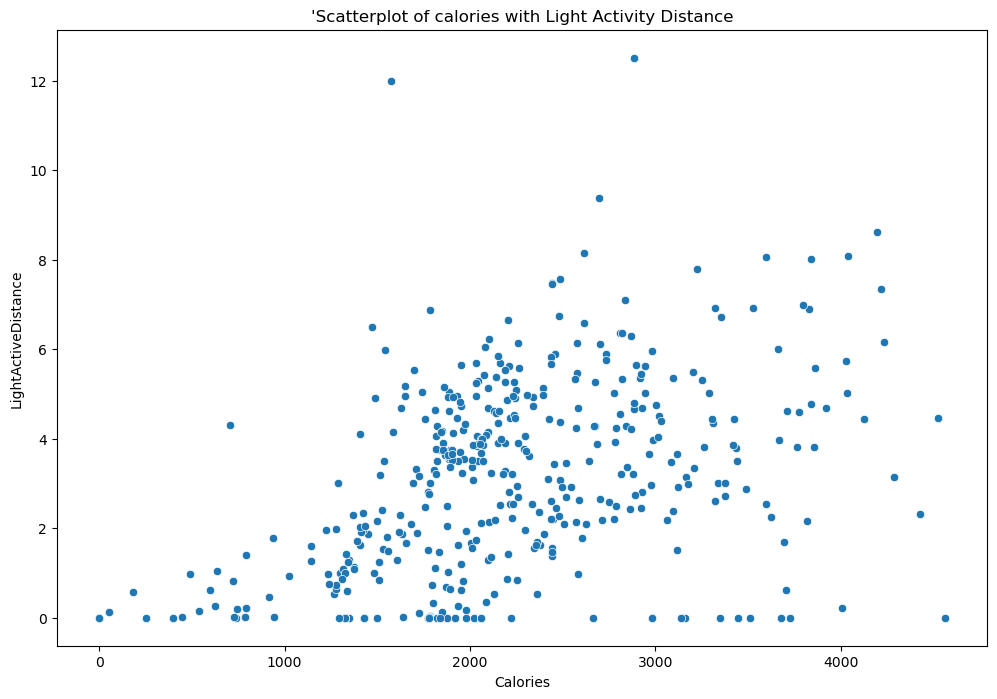

In [15]:
plt.figure(figsize=(12,8))

sns.scatterplot(x='Calories', y='LightActiveDistance', data=df_raw, )
plt.title("'Scatterplot of calories with Light Activity Distance")
plt.show()

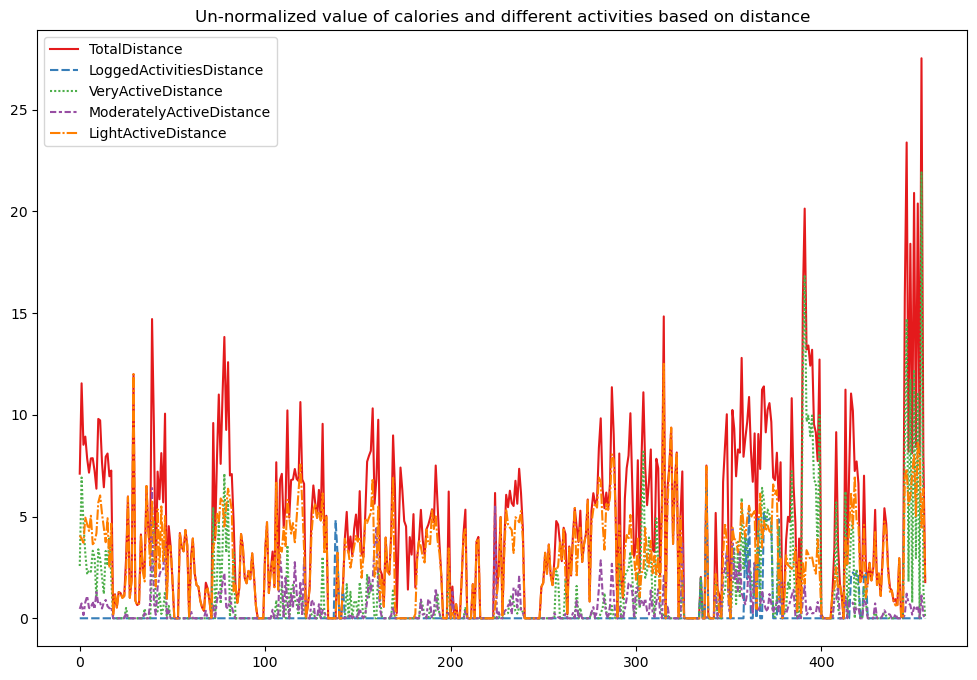

In [17]:
column2 = ['TotalDistance','LoggedActivitiesDistance','VeryActiveDistance','ModeratelyActiveDistance', 'LightActiveDistance']
line_df2 = df_raw[column2]

plt.figure(figsize=(12,8))
sns.lineplot(data=line_df2, palette='Set1')
plt.title('Un-normalized value of calories and different activities based on distance')
plt.show()